<a href="https://colab.research.google.com/github/MarioPariona117/3D-GS/blob/Leo/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
### If it's your first time in this notebook, run the following, with your own email

In [ ]:
# !ssh-keygen -t rsa -b 4096 -C "rt590@cam.ac.uk" -f ~/.ssh/id_rsa -N ""

In [ ]:
# !cat ~/.ssh/id_rsa.pub
# Copy this public key to your keys section in Github settings

In [ ]:
# !eval "$(ssh-agent -s)" && ssh-add ~/.ssh/id_rsa && ssh-add -l || echo "SSH setup failed"

Agent pid 1856
Identity added: /root/.ssh/id_rsa (rt590@cam.ac.uk)
4096 SHA256:pFijRLbFRAaegBSqSPeESgGNqEDDp1OzSefnCpmpbuQ rt590@cam.ac.uk (RSA)


In [ ]:
# !ssh-keyscan -t rsa github.com >> ~/.ssh/known_hosts

In [ ]:
# !cp -r ~/.ssh /content/drive/MyDrive/.ssh_backup

In [1]:
from google.colab import drive
import os
if not os.path.exists('/content/drive'):
  drive.mount('/content/drive')

!ls /content/drive/MyDrive/.ssh_backup

!mkdir -p ~/.ssh
!cp -r /content/drive/MyDrive/.ssh_backup/.ssh/* ~/.ssh
!chmod 700 ~/.ssh
!chmod 600 ~/.ssh/id_rsa
!chmod 644 ~/.ssh/known_hosts

# Start SSH agent and add the key
!eval "$(ssh-agent -s)"
!ssh-add ~/.ssh/id_rsa

# Test SSH connection
!ssh -T git@github.com

Agent pid 1492
Could not open a connection to your authentication agent.
Hi Ryuichi-Student! You've successfully authenticated, but GitHub does not provide shell access.


In [ ]:
# %cd /content

# !git clone -b elacs --recursive git@github.com:MarioPariona117/3D-GS.git

# %cd /content/3D-GS
# !git checkout Leo
# !git pull
# !rm -rf SIBR_viewers
# !git rm --cached SIBR_viewers

# !git checkout elacs sibr_core/ submodules/ .gitignore .gitmodules

# !pip install -q plyfile
# !git clone --recursive git@github.com:MarioPariona117/3D-GS.git

# %cd /content/3D-GS
# !git checkout Leo
# !rm -rf submodules/*
# !rm -rf .gitmodules

# !git rm --cached submodules/*

# !git rm --cached .gitmodules

# !touch .gitmodules

# !git submodule add https://gitlab.inria.fr/bkerbl/simple-knn.git submodules/simple-knn

# !git submodule add https://github.com/graphdeco-inria/diff-gaussian-rasterization.git submodules/diff-gaussian-rasterization

# !git submodule add --name "SIBR_viewers" https://gitlab.inria.fr/sibr/sibr_core.git sibr_core

# !git submodule add https://github.com/rahul-goel/fused-ssim.git submodules/fused-ssim


/content/3D-GS
Already on 'Leo'
Your branch is up to date with 'origin/Leo'.
Already up to date.


In [2]:
%cd /content
!git clone -b Leo --recursive git@github.com:MarioPariona117/3D-GS.git
!pip install -q plyfile

%cd /content/3D-GS
!git checkout Leo
# !git checkout 2703fa3
!git pull
!pip install -q submodules/diff-gaussian-rasterisation
!pip install -q submodules/simple-knn


# !git checkout Leo

/content
Cloning into '3D-GS'...
remote: Enumerating objects: 1311, done.
remote: Counting objects: 100% (206/206), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 1311 (delta 184), reused 174 (delta 173), pack-reused 1105 (from 1)
Receiving objects: 100% (1311/1311), 85.73 MiB | 47.30 MiB/s, done.
Resolving deltas: 100% (781/781), done.
Submodule 'SIBR_viewers' (https://gitlab.inria.fr/sibr/sibr_core.git) registered for path 'sibr_core'
Submodule 'submodules/diff-gaussian-rasterisation' (https://github.com/graphdeco-inria/diff-gaussian-rasterization.git) registered for path 'submodules/diff-gaussian-rasterisation'
Submodule 'submodules/fused-ssim' (https://github.com/rahul-goel/fused-ssim.git) registered for path 'submodules/fused-ssim'
Submodule 'submodules/simple-knn' (https://gitlab.inria.fr/bkerbl/simple-knn.git) registered for path 'submodules/simple-knn'
Cloning into '/content/3D-GS/sibr_core'...
remote: Enumerating objects: 3270, done.        
remote: Count

In [3]:
!wget https://huggingface.co/camenduru/gaussian-splatting/resolve/main/tandt_db.zip
!unzip tandt_db.zip

--2024-12-02 17:50:26--  https://huggingface.co/camenduru/gaussian-splatting/resolve/main/tandt_db.zip
Resolving huggingface.co (huggingface.co)... 108.156.201.58, 108.156.201.102, 108.156.201.48, ...
Connecting to huggingface.co (huggingface.co)|108.156.201.58|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.hf.co/repos/69/11/6911555bcb5edae447d514169831329398b45a3ed9ae3b00817878bc501559a1/816e62f22a161abbfe841d2a6b10cdf036e297c9fa289b3bfeee9c6ec526d7e1?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27tandt_db.zip%3B+filename%3D%22tandt_db.zip%22%3B&response-content-type=application%2Fzip&Expires=1733421027&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTczMzQyMTAyN319LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy5oZi5jby9yZXBvcy82OS8xMS82OTExNTU1YmNiNWVkYWU0NDdkNTE0MTY5ODMxMzI5Mzk4YjQ1YTNlZDlhZTNiMDA4MTc4NzhiYzUwMTU1OWExLzgxNmU2MmYyMmExNjFhYmJmZTg0MWQyYTZiMTBjZGYwMzZlMjk3YzlmYTI4OWIzYmZlZWU5Yz

In [ ]:
!git pull

Already up to date.


In [16]:
# !git checkout "main"

# %cd /content/3D-GS

# !git config --global user.email "rt590@cam.ac.uk"
# !git config --global user.name "Ryuichi-Student"

# # !git stash
# # !git checkout "Leo"
# # !git stash apply
# # !git add submodules/\*
# # !git add .gitignore
# # !git add .gitmodules
# # !git add sibr_core/\*

# !git add .

# !git commit -m "COLAB: Small update"

# !git push --set-upstream origin Branch
# !git push

[Leo 0cc7c6f] COLAB: Small update
 1 file changed, 9 insertions(+), 3 deletions(-)
Enumerating objects: 7, done.
Counting objects: 100% (7/7), done.
Delta compression using up to 12 threads
Compressing objects: 100% (4/4), done.
Writing objects: 100% (4/4), 473 bytes | 473.00 KiB/s, done.
Total 4 (delta 3), reused 0 (delta 0), pack-reused 0
remote: Resolving deltas: 100% (3/3), completed with 3 local objects.
To github.com:MarioPariona117/3D-GS.git
   7258617..0cc7c6f  Leo -> Leo


In [ ]:
# !git add render.py
# !git commit -m "COLAB: Multithreaded render.py\n Solves CPU and GPU underutilisation (4x utilisation)"
# !git pull origin main -r
# !git push
# !git pull -r

# !git add .gitignore
# !git rebase --continue

From github.com:MarioPariona117/3D-GS
 * branch            main       -> FETCH_HEAD
Auto-merging .gitignore
CONFLICT (content): Merge conflict in .gitignore
Auto-merging main.ipynb
CONFLICT (add/add): Merge conflict in main.ipynb
CONFLICT (rename/delete): submodules/diff-gaussian-rasterization renamed to submodules/diff-gaussian-rasterisation in HEAD, but deleted in df5059a27e10499e734017ca12704b0ca3bebd2a.
Automatic merge failed; fix conflicts and then commit the result.


In [2]:
!pip install tensorboard
%load_ext tensorboard

In [3]:
%tensorboard --logdir ./output

<IPython.core.display.Javascript object>

In [9]:
%cd /content/3D-GS
# A100 is approx 3 times faster than T4 (15 minutes vs 49)

!python train.py -s /content/3D-GS/tandt/train --s_prime_lr 0.001 --v_lr 0.001
# !python train.py -s /content/3D-GS/tandt/train

/content/3D-GS
2024-12-02 19:11:02.054832: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-02 19:11:02.072272: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-02 19:11:02.093201: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-02 19:11:02.099617: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-02 19:11:02.114820: I tensorflow/core/platform/c

In [12]:
!mkdir -p /content/drive/MyDrive/saved_models
# !cp -r ./output/* /content/drive/MyDrive/saved_models
!cp -r output/dbb1ceea-c /content/drive/MyDrive/saved_models/

# From Google Drive
!rm -rf saved_output
!mkdir -p saved_output

# Original
!cp -r /content/drive/MyDrive/saved_models/9f598e1d-f saved_output

# New
!cp -r /content/drive/MyDrive/saved_models/dbb1ceea-c saved_output

# !cp -r /content/drive/MyDrive/saved_models/* saved_output

In [13]:
!python render.py -m saved_output/dbb1ceea-c
!python render.py -m saved_output/9f598e1d-f

Looking for config file in saved_output/dbb1ceea-c/cfg_args
Config file found: saved_output/dbb1ceea-c/cfg_args
Rendering saved_output/dbb1ceea-c
Loading trained model at iteration 30000 [02/12 19:28:13]
Reading camera 301/301 [02/12 19:28:14]
Loading Training Cameras [02/12 19:28:14]
Loading Test Cameras [02/12 19:28:19]
Using 12 threads for rendering [02/12 19:28:20]
Rendering progress: 100% 301/301 [00:16<00:00, 18.22it/s]
Looking for config file in saved_output/9f598e1d-f/cfg_args
Config file found: saved_output/9f598e1d-f/cfg_args
Rendering saved_output/9f598e1d-f
Loading trained model at iteration 30000 [02/12 19:28:40]
Reading camera 301/301 [02/12 19:28:42]
Loading Training Cameras [02/12 19:28:42]
Loading Test Cameras [02/12 19:28:46]
Using 12 threads for rendering [02/12 19:28:48]
Rendering progress: 100% 301/301 [00:16<00:00, 18.00it/s]


Ground Truth Image:


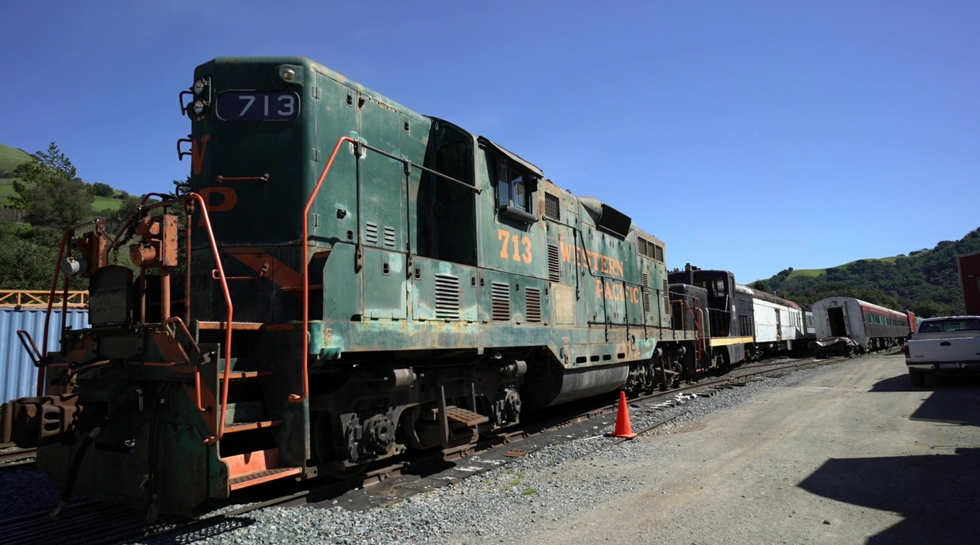


Rendered Image:


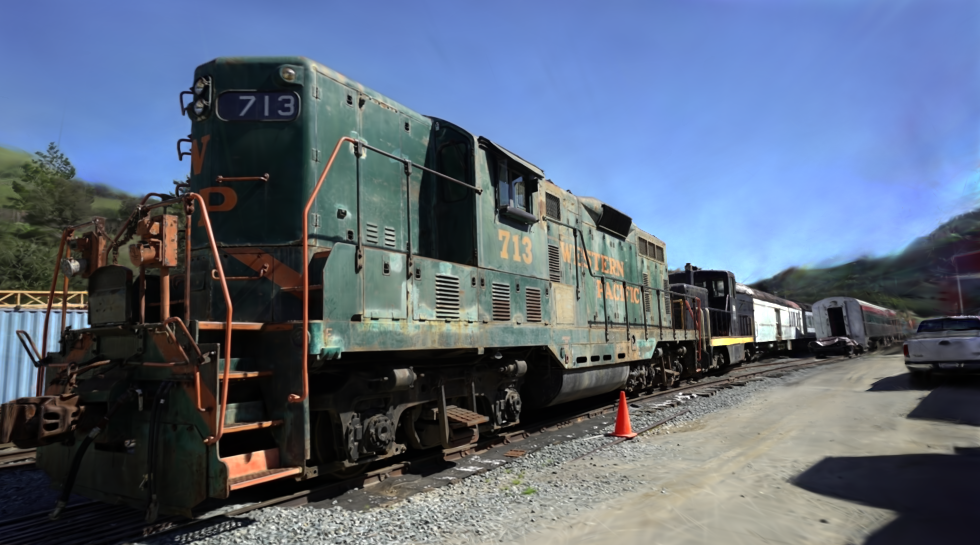

In [ ]:
from IPython.display import Image, display

saved_model = "9f598e1d-f"
saved_iters = 30000
png = "00000.png"

gt_path = f'saved_output/{saved_model}/train/ours_{saved_iters}/gt/{png}'
render_path = f'saved_output/{saved_model}/train/ours_{saved_iters}/renders/{png}'

print("Ground Truth Image:")
display(Image(filename=gt_path))

print("\nRendered Image:")
display(Image(filename=render_path))

Ground Truth Image:


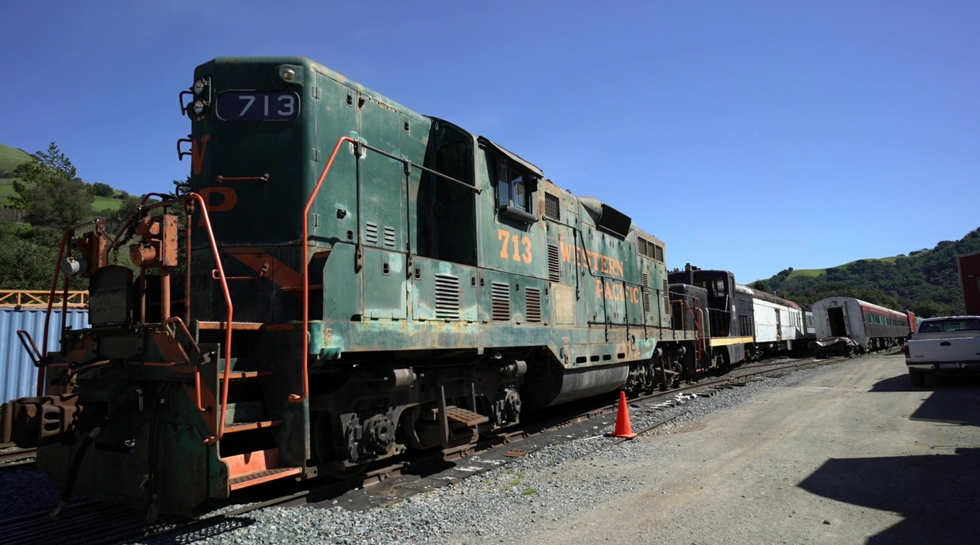

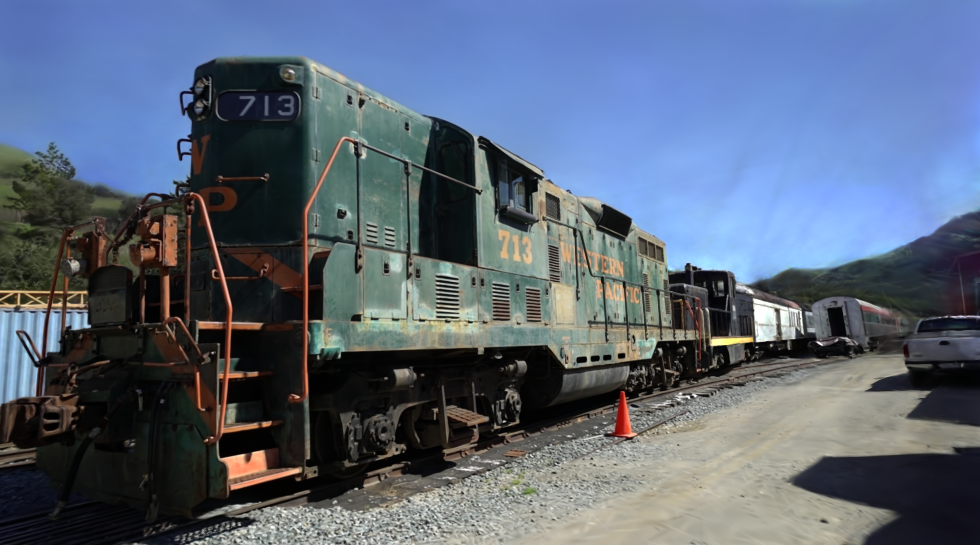


Rendered Image:


In [14]:
from IPython.display import Image, display

saved_model = "dbb1ceea-c"
saved_iters = 30000
png = "00000.png"

gt_path = f'saved_output/{saved_model}/train/ours_{saved_iters}/gt/{png}'
render_path = f'saved_output/{saved_model}/train/ours_{saved_iters}/renders/{png}'

print("Ground Truth Image:")
display(Image(filename=gt_path))

print("\nRendered Image:")
display(Image(filename=render_path))